In [1]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

In [2]:
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth

from pydrive.drive import GoogleDrive

from google.colab import auth

from oauth2client.client import GoogleCredentials

auth.authenticate_user()

gauth = GoogleAuth()

gauth.credentials = GoogleCredentials.get_application_default()

drive = GoogleDrive(gauth)


from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from itertools import chain
from glob import glob
from collections import Counter
from pprint import pprint

id2class_map = {
    '0' : 'Ambulance',
    '1' : 'Bus',
    '2' : 'Car',
    '3' : 'Motorcyle',
    '4' : 'Truck'
}

main_path = "/content/drive/MyDrive/Cars Detection"

def print_data_size(folder_type):
    data_size = len(glob(f'{main_path}/{folder_type}/labels/*.txt'))
    print(f'{folder_type} data count: {data_size}')

def print_class_count(folder_type):
    class_list = []
    for file in glob(f'{main_path}/{folder_type}/labels/*.txt'):
        class_list.append([row.split()[0] for row in open(file, "r")])
    counter = Counter(list(chain(*class_list)))
    print(f'-- data class count')
    pprint({f'{k}. {id2class_map[k]}':v for k, v in counter.items()})
    print()

print_data_size('train')
print_class_count('train')
print_data_size('valid')
print_class_count('valid')
print_data_size('test')
print_class_count('test')

train data count: 878
-- data class count
{'0. Ambulance': 170,
 '1. Bus': 198,
 '2. Car': 914,
 '3. Motorcyle': 202,
 '4. Truck': 192}

valid data count: 250
-- data class count
{'0. Ambulance': 64,
 '1. Bus': 46,
 '2. Car': 238,
 '3. Motorcyle': 46,
 '4. Truck': 60}

test data count: 126
-- data class count
{'0. Ambulance': 18,
 '1. Bus': 38,
 '2. Car': 150,
 '3. Motorcyle': 32,
 '4. Truck': 20}



In [4]:
import os
import cv2
from matplotlib import pyplot as plt

main_path = f"/content/drive/MyDrive/Cars Detection"

def get_bbox_and_label(image_name, data_type='train', main_path=main_path):
    ''' get bbox and label information from label txt files '''

    # read file from path
    lbl_path = os.path.join(main_path, data_type, 'labels', f'{image_name}.txt')
    with open(lbl_path, 'r') as f:
        lines = f.readlines()

    # extract bboxes and labels from the label file
    bboxes = [
        [float(n) for n in line.split()[1:]]
        for line in lines
    ]
    labels = [id2class_map[line.split()[0]] for line in lines]

    return bboxes, labels

def load_image(image_name, data_type='train', main_path=main_path):
    img_path = os.path.join(main_path, data_type, 'images', f'{image_name}.jpg')
    image = cv2.imread(img_path)
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def get_bbox_coordinates(img, bbox):
    # reference
    # https://medium.com/@miramnair/yolov7-calculating-the-bounding-box-coordinates-8bab54b97924

    img_height, img_width, _ = img.shape
    x_center, y_center, bbox_width, bbox_height = bbox

    # calculate the coordinates of the bounding box
    x_center_pixel = x_center * img_width
    y_center_pixel = y_center * img_height
    half_width = bbox_width * img_width / 2
    half_height = bbox_height * img_height / 2

    x_min = int(x_center_pixel - half_width)
    y_min = int(y_center_pixel - half_height)
    x_max = int(x_center_pixel + half_width)
    y_max = int(y_center_pixel + half_height)

    return x_min, y_min, x_max, y_max

class2color_map = {
    'Ambulance': (0,255,128),
    'Bus': (255,51,51),
    'Car': (51,255,255),
    'Motorcyle': (224,102,255),
    'Truck': (160, 255, 255)
}

def plot_image(image_name, data_type='train', class2color_map=class2color_map):
    img = load_image(image_name=image_name, data_type=data_type)
    bboxes, labels = get_bbox_and_label(image_name=image_name, data_type=data_type)
    for bbox, label in zip(bboxes, labels):

        # get bbox and label info
        color = class2color_map[label]
        x_min, y_min, x_max, y_max = get_bbox_coordinates(img, bbox)

        # add bounding box with rectangle
        img = cv2.rectangle(img,(x_min,y_min),(x_max,y_max), color, 2)

        # add label info
        img = cv2.putText(
                img,
                label,
                (x_min, y_min + 10),
                fontFace = cv2.FONT_HERSHEY_SIMPLEX,
                fontScale = 0.6,
                color = color,
                thickness=2
            )
    plt.imshow(img)
    plt.show()

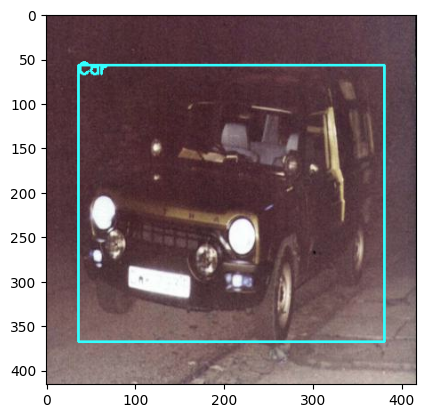

In [5]:
plot_image(image_name='005980b3a5f93085_jpg.rf.2QZCXGReqcBORWQJKQfO')

In [6]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 4.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [7]:
import os

from ultralytics import YOLO

model = YOLO("yolov9c.pt")
model.info

100%|██████████| 49.4M/49.4M [00:00<00:00, 246MB/s]


<bound method Model.info of YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): RepNCSPELAN4(
        (cv1): Conv(
          (conv): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Sequential(
          (0): RepCSP(
            (cv1): Conv(
              (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (act): SiLU(inplace=True)
            )
            (cv3): Conv(
              (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (act): SiLU(inplace=True)
            )
            (m): Sequential(
              (0): RepBottleneck(
                (cv1): RepConv(
                  (act): SiLU(inplace=True)
                  (conv1): Conv(
                    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                    (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
                    (act): Identity()
                  )
                  (conv2): Conv(
                    (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
                    (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
                    (act): Identity()
                  )
                )
                (cv2): Conv(
                  (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                  (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
                  (act): SiLU(inplace=True)
                )
              )
            )
          )
          (1): Conv(
            (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            (act): SiLU(inplace=True)
          )
        )
        (cv3): Sequential(
          (0): RepCSP(
            (cv1): Conv(
              (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (act): SiLU(inplace=True)
            )
            (cv3): Conv(
              (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
              (act): SiLU(inplace=True)
            )
            (m): Sequential(
              (0): RepBottleneck(
                (cv1): RepCon

In [8]:
import yaml

with open(os.path.join(main_path,'coco128.yaml'), 'r' ) as file:
    print(file.read())


In [9]:
data = {
    'train' : '/content/drive/MyDrive/Cars Detection/train',
    'val' : '/content/drive/MyDrive/Cars Detection/test',
    'nc' : 5,
    'names' : [
        'Ambulance',
        'Bus',
        'Car',
        'Motorcyle',
        'Truck'
    ]
}

with open('/content/drive/MyDrive/Cars Detection/working/data.yaml','w') as file:
    yaml.dump(data,file)

with open('/content/drive/MyDrive/Cars Detection/working/data.yaml','r') as file:
    print(file.read())

names:
- Ambulance
- Bus
- Car
- Motorcyle
- Truck
nc: 5
train: /content/drive/MyDrive/Cars Detection/train
val: /content/drive/MyDrive/Cars Detection/test



In [10]:
os.environ["WANDB_MODE"] = "disabled"

model.train(
    data = '/content/drive/MyDrive/Cars Detection/working/data.yaml',
    epochs = 50,
    workers = 1,
    batch = 8,
)

Ultralytics YOLOv8.2.28 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.pt, data=/content/drive/MyDrive/Cars Detection/working/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=1, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels

100%|██████████| 755k/755k [00:00<00:00, 14.7MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 66.5MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Cars Detection/train/labels.cache... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Cars Detection/test/labels.cache... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 1 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       6.1G      1.189      2.306      1.508         29        640: 100%|██████████| 110/110 [03:54<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        126        258      0.362      0.352      0.257      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.86G      1.493      2.467      1.749         30        640: 100%|██████████| 110/110 [00:50<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.03it/s]

                   all        126        258      0.763      0.126      0.137     0.0708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.87G      1.629      2.696      1.895         14        640: 100%|██████████| 110/110 [00:51<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.84it/s]

                   all        126        258     0.0747      0.227     0.0366      0.016



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.87G      1.686      2.694      1.913         20        640: 100%|██████████| 110/110 [00:48<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.40it/s]

                   all        126        258      0.137       0.26      0.143      0.094



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.86G      1.636      2.601      1.876         19        640: 100%|██████████| 110/110 [00:48<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.14it/s]

                   all        126        258      0.144      0.258      0.138     0.0646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.86G      1.556      2.446       1.79         30        640: 100%|██████████| 110/110 [00:48<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.53it/s]

                   all        126        258      0.194      0.306      0.168     0.0781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.87G      1.503      2.416      1.796         26        640: 100%|██████████| 110/110 [00:49<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.75it/s]

                   all        126        258      0.321      0.419      0.318       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.85G      1.424      2.325      1.727         15        640: 100%|██████████| 110/110 [00:51<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.97it/s]

                   all        126        258      0.241      0.424      0.307      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.86G      1.394      2.242      1.692         16        640: 100%|██████████| 110/110 [00:50<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.98it/s]

                   all        126        258      0.675       0.36       0.32      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.86G      1.343      2.147      1.651         23        640: 100%|██████████| 110/110 [00:49<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.56it/s]

                   all        126        258      0.558      0.406      0.431      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.87G      1.341      2.111      1.636         15        640: 100%|██████████| 110/110 [00:48<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.30it/s]

                   all        126        258      0.212      0.436      0.352       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.88G      1.314      2.033      1.635         17        640: 100%|██████████| 110/110 [00:48<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]

                   all        126        258      0.187       0.43      0.329      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      5.87G       1.32      2.031      1.621         19        640: 100%|██████████| 110/110 [00:50<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.94it/s]

                   all        126        258      0.383      0.409      0.417       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.86G      1.243      1.921      1.577         23        640: 100%|██████████| 110/110 [00:49<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.07it/s]

                   all        126        258      0.386       0.44      0.441      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.86G       1.21      1.842      1.542         24        640: 100%|██████████| 110/110 [00:49<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.04it/s]

                   all        126        258      0.538       0.49      0.521      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.86G      1.172      1.809      1.516         19        640: 100%|██████████| 110/110 [00:49<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.07it/s]

                   all        126        258      0.517      0.511      0.531      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.86G      1.171      1.755      1.508         22        640: 100%|██████████| 110/110 [00:49<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.76it/s]

                   all        126        258      0.602       0.48      0.555      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.87G      1.178       1.71        1.5         29        640: 100%|██████████| 110/110 [00:50<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.32it/s]

                   all        126        258      0.504      0.573      0.507      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.87G       1.13      1.654      1.477         30        640: 100%|██████████| 110/110 [00:48<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.40it/s]

                   all        126        258      0.653      0.517      0.564      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.86G      1.132      1.621      1.474         28        640: 100%|██████████| 110/110 [00:48<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]

                   all        126        258      0.587      0.534      0.607      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.86G      1.093      1.603      1.442         24        640: 100%|██████████| 110/110 [00:48<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]

                   all        126        258      0.638      0.484      0.563      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.86G      1.085      1.539      1.441         22        640: 100%|██████████| 110/110 [00:48<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.53it/s]

                   all        126        258      0.515       0.51      0.542      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.85G      1.077      1.509      1.438         27        640: 100%|██████████| 110/110 [00:49<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.94it/s]

                   all        126        258      0.522      0.463      0.513       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.86G       1.06      1.487      1.414         23        640: 100%|██████████| 110/110 [00:49<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.06it/s]

                   all        126        258      0.459      0.558      0.532      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.84G      1.047      1.471      1.416         33        640: 100%|██████████| 110/110 [00:50<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.05it/s]

                   all        126        258      0.686      0.489        0.6      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.86G      1.009       1.42      1.389         23        640: 100%|██████████| 110/110 [00:49<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.63it/s]

                   all        126        258      0.521      0.548      0.554       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.86G     0.9729      1.325      1.347         22        640: 100%|██████████| 110/110 [00:48<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.16it/s]

                   all        126        258      0.683      0.601      0.672      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.86G       0.98      1.329      1.351         16        640: 100%|██████████| 110/110 [00:49<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.70it/s]

                   all        126        258       0.79      0.557      0.651       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.86G     0.9704      1.274      1.361         26        640: 100%|██████████| 110/110 [00:49<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.03it/s]

                   all        126        258        0.6      0.606      0.645      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.87G      0.957      1.274      1.342         19        640: 100%|██████████| 110/110 [00:49<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.02it/s]

                   all        126        258      0.621      0.601      0.624      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.87G     0.9776      1.319      1.371         16        640: 100%|██████████| 110/110 [00:49<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.04it/s]

                   all        126        258      0.735      0.569      0.653      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.86G     0.9131      1.206      1.297         17        640: 100%|██████████| 110/110 [00:50<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.84it/s]

                   all        126        258      0.613      0.593      0.616       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.86G     0.8991      1.163      1.298         27        640: 100%|██████████| 110/110 [00:50<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.35it/s]

                   all        126        258      0.764      0.621      0.666      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.87G     0.9003      1.127      1.298         16        640: 100%|██████████| 110/110 [00:48<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]

                   all        126        258      0.735      0.552      0.632      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.86G     0.8742      1.135      1.282          8        640: 100%|██████████| 110/110 [00:48<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.41it/s]

                   all        126        258      0.681      0.662       0.68      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.85G     0.8687      1.109      1.277         14        640: 100%|██████████| 110/110 [00:48<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.37it/s]

                   all        126        258      0.663      0.597      0.641      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.86G     0.8494      1.047      1.259         34        640: 100%|██████████| 110/110 [00:49<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.75it/s]

                   all        126        258      0.721      0.679      0.698      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.86G     0.8379      1.037      1.253         20        640: 100%|██████████| 110/110 [00:50<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.07it/s]

                   all        126        258      0.778      0.625      0.686      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.87G     0.8492      1.028      1.262         19        640: 100%|██████████| 110/110 [00:49<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.02it/s]

                   all        126        258      0.704      0.626      0.666      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.86G     0.8028     0.9931      1.228         20        640: 100%|██████████| 110/110 [00:50<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.06it/s]

                   all        126        258      0.781      0.638      0.706      0.524


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
      41/50      5.87G      0.728     0.8485      1.192         11        640: 100%|██████████| 110/110 [00:50<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.66it/s]

                   all        126        258      0.733      0.648       0.69      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      5.86G      0.722     0.7647      1.184          9        640: 100%|██████████| 110/110 [00:49<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.21it/s]

                   all        126        258      0.787      0.605      0.674      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      5.86G     0.7089     0.7499      1.176         16        640: 100%|██████████| 110/110 [00:50<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.21it/s]

                   all        126        258      0.728      0.654      0.723      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.86G     0.6631     0.6854      1.143          8        640: 100%|██████████| 110/110 [00:49<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.08it/s]

                   all        126        258      0.686      0.715      0.733      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.86G     0.6717     0.6902      1.162         11        640: 100%|██████████| 110/110 [00:49<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  2.91it/s]

                   all        126        258      0.632      0.735      0.696      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.86G     0.6429     0.6575      1.137         13        640: 100%|██████████| 110/110 [00:50<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.05it/s]

                   all        126        258      0.814      0.622      0.721      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.87G     0.6189     0.6241      1.112         11        640: 100%|██████████| 110/110 [00:49<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.46it/s]

                   all        126        258      0.775      0.604      0.704      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      5.86G     0.6208     0.5962      1.113          9        640: 100%|██████████| 110/110 [00:50<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.38it/s]

                   all        126        258      0.769      0.705      0.741      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      5.87G      0.602     0.5836      1.092         16        640: 100%|██████████| 110/110 [00:48<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.32it/s]

                   all        126        258      0.825      0.643       0.75      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.87G     0.5873     0.5678      1.091         11        640: 100%|██████████| 110/110 [00:48<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.06it/s]

                   all        126        258      0.709      0.697      0.738      0.568



50 epochs completed in 0.812 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 51.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.28 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25323103 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:06<00:00,  1.32it/s]


                   all        126        258      0.826      0.643      0.751      0.576
             Ambulance         18         18      0.896          1      0.995      0.959
                   Bus         22         38      0.797      0.632      0.748      0.582
                   Car         60        150      0.854      0.547       0.69      0.465
             Motorcyle         12         32      0.837      0.438       0.62      0.311
                 Truck         14         20      0.743        0.6        0.7      0.563
Speed: 0.6ms preprocess, 20.5ms inference, 0.0ms loss, 9.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c4e73689330>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [12]:
from ultralytics import YOLO

model = YOLO('/content/runs/detect/train/weights/best.pt')

In [13]:
def plot_pred_image(image_name, id2class_map=id2class_map, class2color_map=class2color_map):
    image_path = os.path.join(main_path, 'test', 'images', f'{image_name}.jpg')

    # get plot elements (bbox, labels) from `predict()` results
    results = model.predict(image_path)
    r = results[0]
    img = r.orig_img
    bboxes = r.boxes.xyxy.tolist()
    labels = [id2class_map[str(int(c))] for c in r.boxes.cls.tolist()]
    for bbox, label in zip(bboxes, labels):
        # get bbox and label info
        color = class2color_map[label]
        x_min, y_min, x_max, y_max = [int(n) for n in bbox]

        # add bounding box with rectangle
        img = cv2.rectangle(img,(x_min,y_min),(x_max,y_max), color, 2)

        # add label info
        img = cv2.putText(
                img,
                label,
                (x_min, y_min + 10),
                fontFace = cv2.FONT_HERSHEY_SIMPLEX,
                fontScale = 0.6,
                color = color,
                thickness=2
            )
    plt.imshow(img)
    plt.show()


In [14]:

def label_image(image_path):
    # Görüntüyü yükleme
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image file '{image_path}' not found or could not be loaded.")

    # Görüntü boyutlarını alma
    original_shape = image.shape[:2]  # (height, width)

    # YOLO modelini kullanarak tahminler yapma
    results = model(image)

    # Tahmin edilen nesneleri al
    labels = results[0].boxes.data.cpu().numpy()  # YOLOv8 için results[0].boxes.data
    predicted_labels = []

    for label in labels:
        x_min, y_min, x_max, y_max, confidence, class_id = label[:6]  # İlk 6 elemanı al
        x_center = (x_min + x_max) / 2 / original_shape[1]
        y_center = (y_min + y_max) / 2 / original_shape[0]
        width = (x_max - x_min) / original_shape[1]
        height = (y_max - y_min) / original_shape[0]
        predicted_labels.append(f"{int(class_id)} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    return predicted_labels

def save_labels(labels, label_path):
    # Etiketleri dosyaya yazma
    with open(label_path, 'w') as file:
        for label in labels:
            file.write(f"{label}\n")


0: 640x640 1 Ambulance, 63.6ms
Speed: 3.7ms preprocess, 63.6ms inference, 7.4ms postprocess per image at shape (1, 3, 640, 640)
The predicted labels for the image are saved to: /content/drive/MyDrive/Cars Detection/test/labels/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg
prediction ↓

image 1/1 /content/drive/MyDrive/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 640x640 1 Ambulance, 61.5ms
Speed: 4.2ms preprocess, 61.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


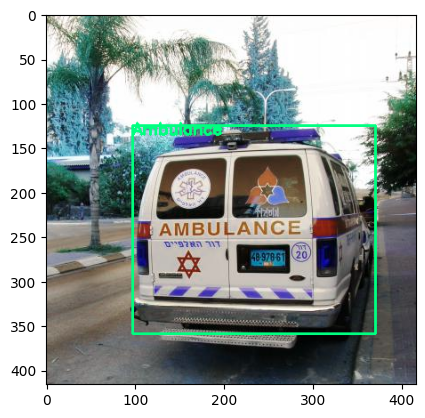

actual image ↓


In [15]:
# Örnek kullanım
image_path = '/content/drive/MyDrive/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg'
label_path = '/content/drive/MyDrive/Cars Detection/test/labels/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg'

# Etiket klasörünün var olup olmadığını kontrol et ve gerekirse oluştur
os.makedirs(os.path.dirname(label_path), exist_ok=True)

try:
    predicted_labels = label_image(image_path)
    save_labels(predicted_labels, label_path)
    print(f'The predicted labels for the image are saved to: {label_path}')
except Exception as e:
    print(f"Error: {e}")

image_name = '00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80'
print('prediction ↓')
plot_pred_image(image_name=image_name)
print('actual image ↓')

In [18]:
import locale
locale.getpreferredencoding = lambda: 'UTF-8'

!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt source='/content/drive/MyDrive/27260-362770008.mp4'

Ultralytics YOLOv8.2.28 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25323103 parameters, 0 gradients, 102.3 GFLOPs

video 1/1 (frame 1/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 (no detections), 136.4ms
video 1/1 (frame 2/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 (no detections), 31.6ms
video 1/1 (frame 3/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 (no detections), 31.5ms
video 1/1 (frame 4/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 (no detections), 31.6ms
video 1/1 (frame 5/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 (no detections), 31.6ms
video 1/1 (frame 6/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 1 Car, 31.5ms
video 1/1 (frame 7/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 1 Car, 31.5ms
video 1/1 (frame 8/335) /content/drive/MyDrive/27260-362770008.mp4: 384x640 1 Car, 31.5ms
video 1/1 (frame 9/335) /content/drive/MyDrive/27260-3627

In [20]:
import io
from IPython.display import HTML
from base64 import b64encode
def show_video(file_name, width=640):
  # show resulting deepsort video
  mp4 = open(file_name,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width="{0}" controls>
        <source src="{1}" type="video/mp4">
  </video>
  """.format(width, data_url))

In [21]:
# Convert avi to mp4
!ffmpeg -y -loglevel panic -i /content/runs/detect/predict/27260-362770008.avi output.mp4

# output object tracking video
path_output = "output.mp4"
show_video(path_output, width=960)